# Compute Spectral Power

## Set-up

### Imports

In [2]:
# imports - general
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import welch
from mne.time_frequency import tfr_array_multitaper

# imports - custom
import sys
sys.path.append("../code")
from info import FS, N_CHANNELS

# autoreload
%load_ext autoreload
%autoreload 2

### Settings

In [3]:
# plotting style
plt.style.use('../mplstyle/notebook.mplstyle')

### Functions

In [4]:
def epoch_data(data, n_channels, n_samples):
    # epoch data (trim to desired number of samples)
    data = data[-n_samples:]

    # interpolate NaN values
    data = data.interpolate(method='linear', axis=0)

    # grab desired channels
    data = data.values[:, :n_channels].T

    return data

In [5]:
# PSD function

def compute_psd(data):
    # compute spectra for each channel
    spectra = []
    for i_chan in range(data.shape[0]):
        freq, power = welch(data[i_chan], fs=FS, nperseg=2**12)
        spectra.append(power)
    power = np.array(power)

    return spectra, freq


def plot_spectra(spectra, freq, title=None, fname=None):

    # plot spectra
    fig, ax = plt.subplots(figsize=(9, 6))
    ax.loglog(freq, spectra.T)
    ax.set(ylabel='power (mV^2/Hz)', xlabel='frequency (Hz)')

    # add title
    if not title is None:
        ax.set_title(title)
    
    # save figure
    if not fname is None:
        plt.savefig(fname)

    plt.show()

In [6]:
# TFR functions

def compute_tfr(signal, fs, n_freqs=128, time_window_length=60, freq_bandwidth=0.1):
    time = np.arange(0, signal.shape[-1]) / fs
    freq = np.linspace(1/signal.shape[-1], fs/2, n_freqs)
    n_cycles = freq * time_window_length # set based on fixed window length
    time_bandwidth =  time_window_length * freq_bandwidth # must be >= 2
    tfr = tfr_array_multitaper(signal[np.newaxis, :], sfreq=FS, freqs=freq, 
                                output='power', n_cycles=n_cycles,
                                time_bandwidth=time_bandwidth)
    
    tfr = np.squeeze(tfr)

    return time, freq, tfr


def zscore_tfr(tfr):
    tfr_z = np.zeros_like(tfr)
    for i_freq in range(tfr.shape[0]):
        tfr_z[i_freq, :] = (tfr[i_freq, :] - np.mean(tfr[i_freq, :])) / np.std(tfr[i_freq, :])

    return tfr_z


def plot_tfr(time, freq, tfr, title=None, fname=None):

    # plot
    fig, ax = plt.subplots(1, 1, figsize=(12, 4))
    ax.pcolormesh(time, freq, tfr, shading='gouraud')
    ax.set(xlabel='time (s)', ylabel='frequency (Hz)')

    # add title
    if not title is None:
        ax.set_title(title)

    # save figure
    if not fname is None:
        plt.savefig(fname)

    plt.show()


## Main

### Compute spectral power
compute power spectral density for each recording sesssion. To normalize the signal duration, the number of samples in the shortest signal will be used. Potentially artifactual activity at the begginning of the signal will also be avoided

In [6]:
# determine number of samples to use for analysis
shortest_signal = 263959
potential_artifact = 50000
n_samples = shortest_signal - potential_artifact
print(f"Number of samples: {n_samples}")

Number of samples: 213959


In [10]:
# identify/create directories
dir_input = '../../../datasets/adamatzky_2021/txt'
dir_output = "../data/psd"
dir_figs = "../figures/psd"

for path in [dir_output, dir_figs]:
    if not os.path.exists(path):
        os.makedirs(path)

In [66]:
# compute PSD for each species and save to file

# load data, compute psd, save to file
for fname in os.listdir(dir_input):
    data = pd.read_csv(os.path.join(dir_input, fname), sep='\t')
    data = epoch_data(data, N_CHANNELS, n_samples)
    spectra, freq = compute_psd(data)
    fname_out = fname.replace('.txt', '.npz')
    np.savez(f"{dir_output}/{fname_out}", spectra=spectra, freq=freq)


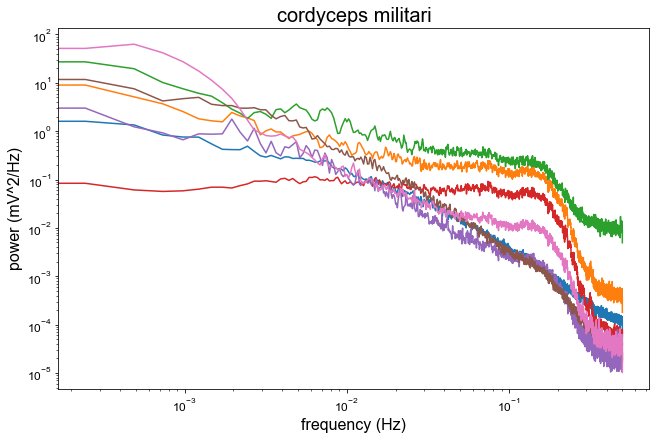

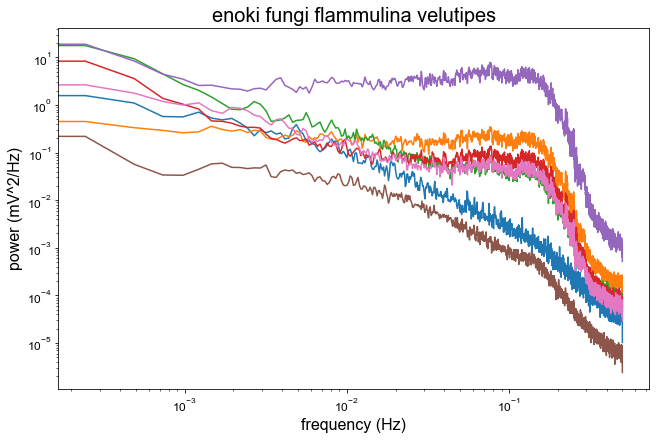

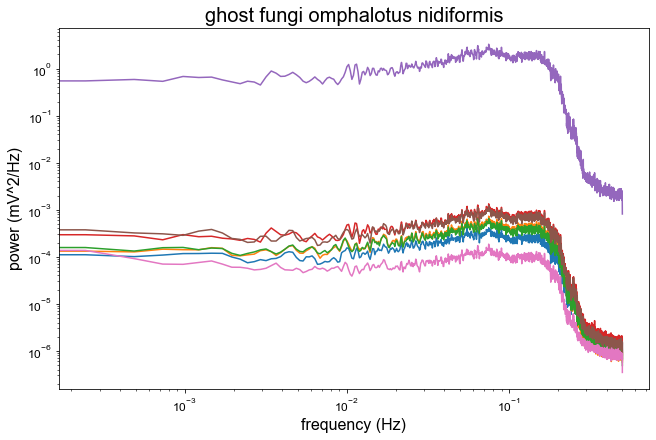

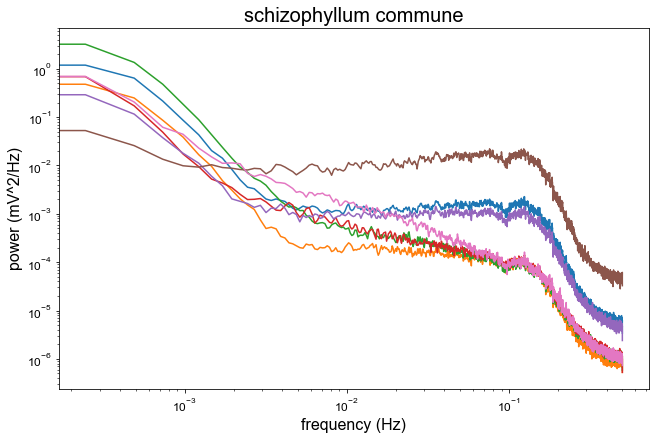

In [11]:
# plot each

files = os.listdir(dir_output)
for fname in files:
    data = np.load(f"{dir_output}/{fname}")
    title = fname.split('.')[0].replace('_',' ')
    plot_spectra(data['spectra'], data['freq'], title,
                 f"{dir_figs}/{fname.replace('.npz', '.png')}")

### plot spectrogram

In [7]:
# identify/create directories
dir_input = '../../../datasets/adamatzky_2021/txt'
dir_output = "../data/tfr"
dir_figs = "../figures/tfr"

for path in [dir_output, dir_figs]:
    if not os.path.exists(path):
        os.makedirs(path)

In [65]:
# # compute spectrogram (TFR) for each species and save to file

# # load data, compute psd, save to file
# for fname in os.listdir(dir_input):
#     data = pd.read_csv(os.path.join(dir_input, fname), sep='\t')
#     data = epoch_data(data, N_CHANNELS, n_samples)
#     time, freq, tfr = compute_tfr(data, FS)
#     fname_out = fname.replace('.txt', '.npz')
#     np.savez(f"{dir_output}/{fname_out}", time=time, freq=freq, tfr=tfr)

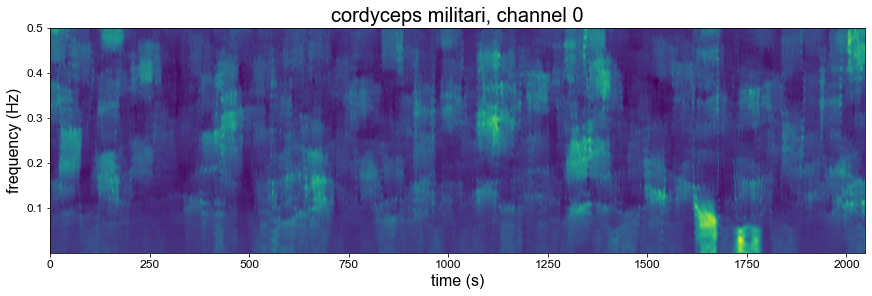

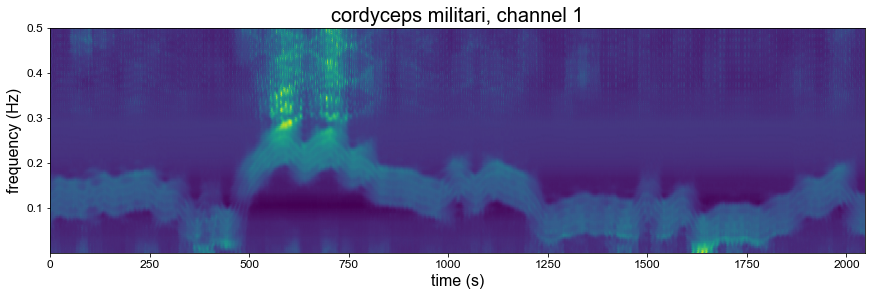

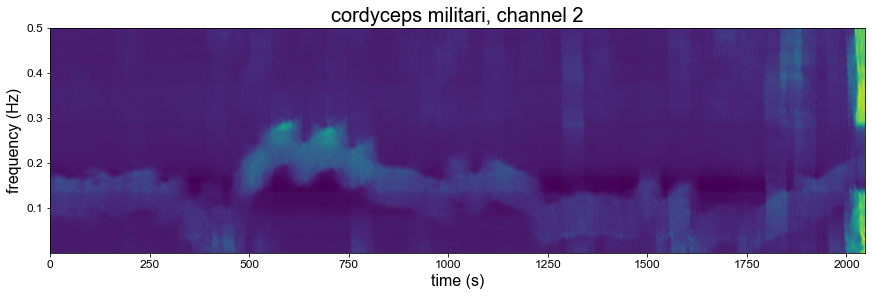

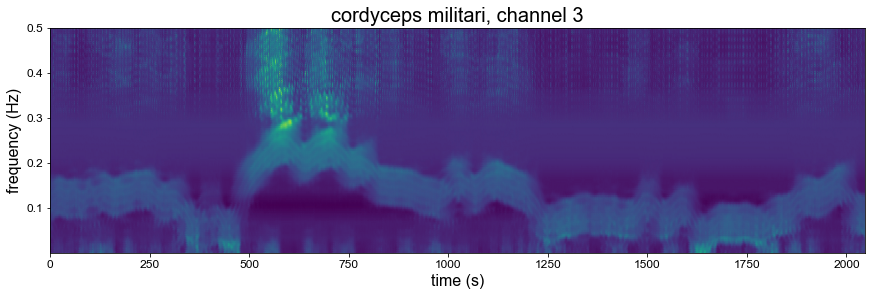

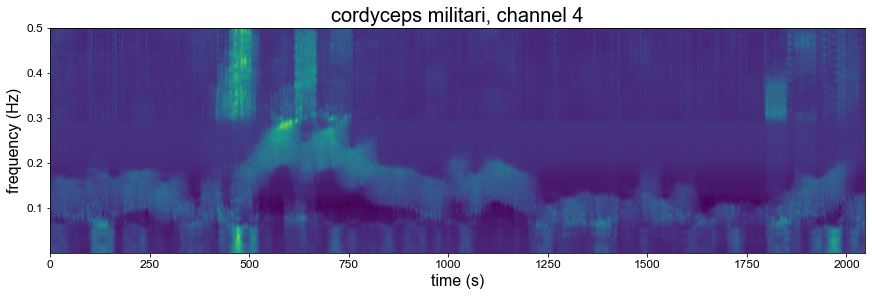

...

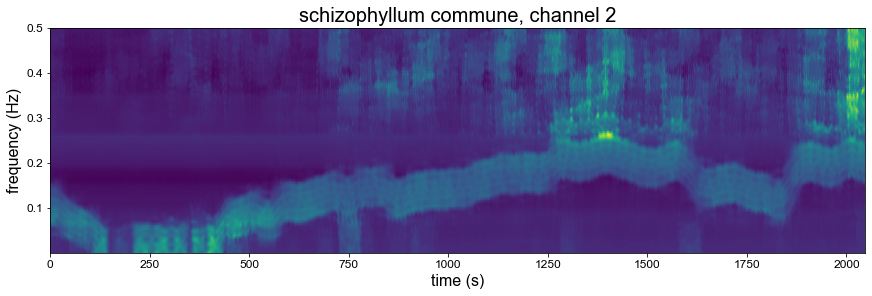

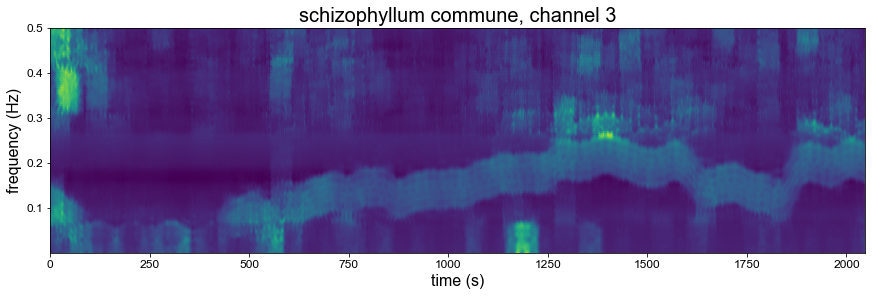

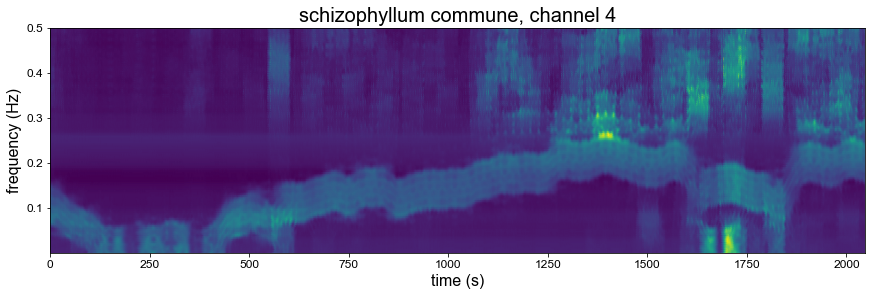

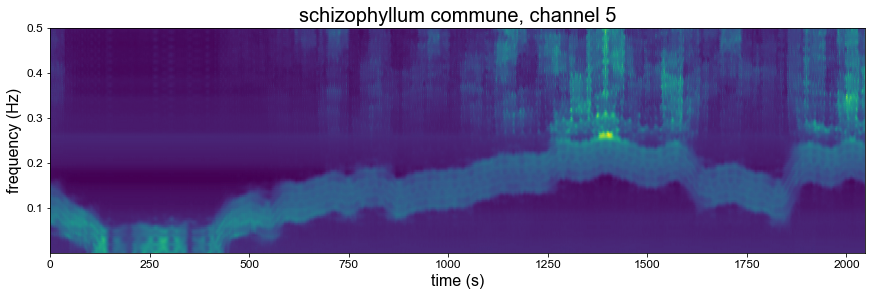

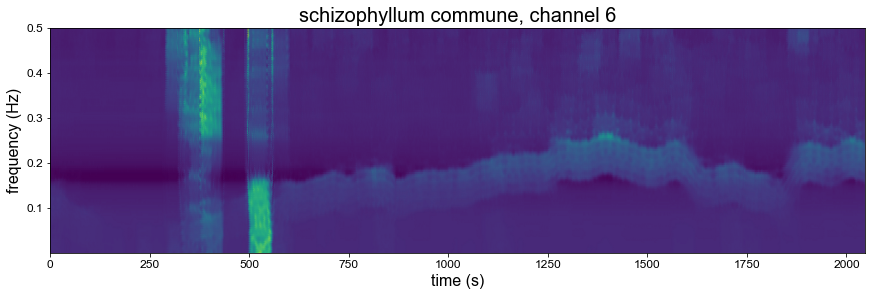

In [11]:
# plot each

# crop to shorter time window and avoid edge artifacts
n_samples = 2**11 # plot shorter time window
time_window_length = 60 # seconds
edge = time_window_length // 2 * FS

# load data, plot tfr, save to file
files = os.listdir(dir_output)
for fname in files:
    # load data
    data = np.load(f"{dir_output}/{fname}")

    # Plot each channel
    for i_chan in range(N_CHANNELS):
        title = f"{fname.split('.')[0].replace('_',' ')}, channel {i_chan}"
        fname_out = f"{dir_figs}/{fname.replace('.npz', f'_chan{i_chan}.png')}"
        # tfr = data['tfr'][i_chan, :, edge:n_samples+edge]
        tfr = data['tfr'][i_chan, :, -(n_samples+edge):-edge] # for the end of the signal
        tfr_z = zscore_tfr(tfr)
        plot_tfr(data['time'][:n_samples], data['freq'], tfr_z, title, fname_out)
        plt.close('all')